**Description:**

The general **SAM** model is fine-tuned using **LoRA** with multiple configurations. The dataset is split into **training**, **validation**, and **testing** sets to identify the best-performing configuration based on segmentation performance.

Figures and detection-time analysis are not computed here, as these require a **separate test set** that is not used during model training.

The data folders used in this analysis were uploaded to **Google Drive**.

Based on the results in the `Experiments` section, the best-performing configuration is the model fine-tuned with **LoRA rank 32**, which achieved the highest test-set scores across all evaluated metrics (*Dice = 0.9275, IoU = 0.8649, Precision = 0.9113, Recall = 0.9443, F1 = 0.9275*). This configuration is selected for evaluation on the independent test set.




In [1]:
!pip install -q torch torchvision
!pip install -q git+https://github.com/facebookresearch/segment-anything.git
!pip install -q opencv-python scikit-image pandas numpy matplotlib tqdm scikit-learn
!pip install -q loralib

  Preparing metadata (setup.py) ... done


In [2]:
import os
from google.colab import drive
import torch
from torch.utils.data import Dataset
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy import stats
import pickle
from pathlib import Path
from PIL import Image
import json
from tqdm import tqdm
from scipy.ndimage import label as ndimage_label
from skimage.morphology import remove_small_holes, remove_small_objects
import matplotlib.patches as patches
from collections import defaultdict
import random
import shutil
from torch.utils.data import DataLoader
import torch.nn.functional as F
import torch.nn as nn
from segment_anything import sam_model_registry
import loralib as lora
from skimage.transform import resize as skimage_resize

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Helper functions

## Dataset Class

This dataset class loads raw images and their corresponding segmentation masks for both reference and treatment conditions.

It automatically pairs each image with the correct mask based on position folders, converts images to a consistent RGB format, and loads masks as integer-labeled instance maps. Optional augmentations can be applied through Albumentations. **The class returns image–mask pairs in a format compatible with PyTorch DataLoaders.**

In [3]:
class BacteriaSegmentationDataset(Dataset):
    def __init__(self,
                 ref_raw_dir, ref_mask_dir,
                 rif_raw_dir, rif_mask_dir,
                 positions,
                 transform=None):

        # Directories for raw images and masks (REF and RIF10 conditions)
        self.ref_raw_dir = ref_raw_dir
        self.ref_mask_dir = ref_mask_dir
        self.rif_raw_dir = rif_raw_dir
        self.rif_mask_dir = rif_mask_dir

        # Albumentations transforms (optional)
        self.transform = transform

        self.samples = [] # List of (image_path, mask_path) pairs
        self._collect_all_paths(positions)

        print(f"Loaded {len(self.samples)} samples")

    # Collect all raw–mask pairs from the given list of positions
    def _collect_all_paths(self, positions):
        for pos in positions:
            if pos < 200:
                # Positions <200 → reference data
                self.samples += self._collect_pos(self.ref_raw_dir, self.ref_mask_dir, pos)
            else:
                # Positions ≥200 → treatment data
                self.samples += self._collect_pos(self.rif_raw_dir, self.rif_mask_dir, pos)

    # Collect all files for a single position
    def _collect_pos(self, raw_dir, mask_dir, pos):
        samples = []
        pos_folder = f"Pos{pos}"

        raw_path = os.path.join(raw_dir, pos_folder, "aphase")
        mask_path = os.path.join(mask_dir, pos_folder, "PreprocessedPhaseMasks")

        if not os.path.exists(raw_path) or not os.path.exists(mask_path):
            print(f"[WARNING] Missing: {raw_path} or {mask_path}")
            return samples
        # Load all raw TIFF images and all corresponding mask files
        raw_files  = sorted([f for f in os.listdir(raw_path) if f.endswith(".tiff")])
        mask_files = sorted([f for f in os.listdir(mask_path) if f.startswith("MASK_")])

        # Pairing
        for rf, mf in zip(raw_files, mask_files):
            samples.append((
                os.path.join(raw_path, rf),
                os.path.join(mask_path, mf)
            ))

        return samples

    def _load_image(self, path):
        img = np.array(Image.open(path))

        # Convert grayscale → RGB
        if img.ndim == 2:
            img = np.stack([img] * 3, axis=-1)

        # Convert (H, W, 1) → RGB
        if img.ndim == 3 and img.shape[2] == 1:
            img = np.repeat(img, 3, axis=2)

        # Convert channel-first → channel-last (rare but safe check)
        if img.ndim == 3 and img.shape[0] == 3 and img.shape[2] != 3:
            img = np.transpose(img, (1, 2, 0))

        # Normalize intensity to 0–255 and convert to uint8
        if img.dtype != np.uint8:
            img = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

        return img


    def _load_mask(self, path):
        """Load instance mask"""
        mask = np.array(Image.open(path))

        # Ensure 2D mask (drop channel if present)
        if mask.ndim == 3:
            mask = mask[:, :, 0]

        return mask.astype(np.int32)  # Instance IDs as integers

    def __len__(self):
        return len(self.samples)
    def __getitem__(self, idx):
        raw_path, mask_path = self.samples[idx]

        image = self._load_image(raw_path)
        mask = self._load_mask(mask_path)

        # Ensure mask size matches image size
        if mask.shape != image.shape[:2]:
            mask = cv2.resize(mask.astype(np.uint8),
                              (image.shape[1], image.shape[0]),
                              interpolation=cv2.INTER_NEAREST)

        # Apply augmentation
        if self.transform:
            transformed = self.transform(image=image, mask=mask)
            image = transformed['image']
            mask = transformed['mask']

        return {
            'image': image,
            'mask': mask,
            'image_path': raw_path,
            'mask_path': mask_path
        }



## Dataset Splitting

The dataset is split by position into roughly **70% training, 20% validation, and 10% testing**, ensuring that all images from a given chamber remain in the same subset to avoid data leakage.

In [ ]:
train_positions = [
    102, 103, 105, 106, 107, 108, 109,
    202, 203, 205, 206, 207, 208, 209
]

val_positions = [
    101, 104,
    201, 204
]

test_positions = [
    110,
    210
]

ref_raw  = "/content/drive/MyDrive/REF_raw_data101_110"
ref_mask = "/content/drive/MyDrive/REF_masks101_110"

rif_raw  = "/content/drive/MyDrive/RIF10_raw_data201_210"
rif_mask = "/content/drive/MyDrive/RIF10_masks201_210"

# Create dataset objects for each split
train_dataset = BacteriaSegmentationDataset(
    ref_raw, ref_mask, rif_raw, rif_mask, train_positions
)

val_dataset = BacteriaSegmentationDataset(
    ref_raw, ref_mask, rif_raw, rif_mask, val_positions
)

test_dataset = BacteriaSegmentationDataset(
    ref_raw, ref_mask, rif_raw, rif_mask, test_positions
)

print("Train samples:", len(train_dataset))
print("Val samples:", len(val_dataset))
print("Test samples:", len(test_dataset))

Loaded 1694 samples
Loaded 484 samples
Loaded 242 samples
Train samples: 1694
Val samples: 484
Test samples: 242


## SAMFinetuner

This class provides a compact fine-tuning pipeline for adapting SAM using LoRA.

**LoRA layers are applied to the image encoder while the pretrained weights remain frozen, and the mask decoder is trained fully.**

In [5]:
class SAMFineTuner_LoRA:
    """
    Fine-tuning wrapper for SAM using LoRA.
    Trains only LoRA layers in the image encoder + the full mask decoder.
    Uses BCE + Dice losses for segmentation.
    """

    def __init__(self, sam_model, device, learning_rate=1e-4, lora_rank=8,
                 optimizer_type='adam', weight_decay=1e-4,
                 bce_weight=1.0, dice_weight=1.0, grad_clip=None,
                 pos_weight=2.0):
        """
        Args:
            sam_model: Pretrained SAM model
            device: CUDA or CPU
            learning_rate: Optimizer learning rate
            lora_rank: Rank of LoRA decomposition
            optimizer_type: 'adam', 'adamw', or 'sgd'
            weight_decay: Weight decay for AdamW/SGD
            bce_weight: Weight for BCE loss
            dice_weight: Weight for Dice loss
            grad_clip: Max gradient norm for clipping
            pos_weight: Weight for positive class in BCE (to reduce false negatives)
        """
        self.sam = sam_model
        self.device = device
        self.lora_rank = lora_rank
        self.grad_clip = grad_clip
        self.bce_weight = bce_weight
        self.dice_weight = dice_weight
        self.pos_weight = pos_weight

        # Apply LoRA to image encoder
        self._apply_lora_to_image_encoder()

        # Freeze base image encoder parameters (LoRA params will be trainable)
        for name, param in self.sam.image_encoder.named_parameters():
            if 'lora' not in name:
                param.requires_grad = False
            else:
                param.requires_grad = True

        # Freeze prompt encoder
        for param in self.sam.prompt_encoder.parameters():
            param.requires_grad = False

        # Train mask decoder fully
        for param in self.sam.mask_decoder.parameters():
            param.requires_grad = True

        # Setup optimizer (LoRA params + mask decoder)
        lora_params = [p for n, p in self.sam.image_encoder.named_parameters()
                      if 'lora' in n and p.requires_grad]
        decoder_params = list(self.sam.mask_decoder.parameters())
        trainable_params = lora_params + decoder_params

        if optimizer_type.lower() == 'adam':
            self.optimizer = torch.optim.Adam(
                trainable_params,
                lr=learning_rate
            )
        elif optimizer_type.lower() == 'adamw':
            self.optimizer = torch.optim.AdamW(
                trainable_params,
                lr=learning_rate,
                weight_decay=weight_decay
            )
        elif optimizer_type.lower() == 'sgd':
            self.optimizer = torch.optim.SGD(
                trainable_params,
                lr=learning_rate,
                momentum=0.9,
                weight_decay=weight_decay
            )
        else:
            raise ValueError(f"Unknown optimizer: {optimizer_type}")

        # Loss functions (BCE + Dice)
        if pos_weight > 1.0:
            self.bce_loss = nn.BCEWithLogitsLoss(
                pos_weight=torch.tensor([pos_weight]).to(device)
            )
            print(f"Using pos_weight={pos_weight} (prioritizing detection recall)")
        else:
            self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_loss = self.dice_loss_fn

        # SAM preprocessing transform
        from segment_anything.utils.transforms import ResizeLongestSide
        self.transform = ResizeLongestSide(sam_model.image_encoder.img_size)

        # Count trainable parameters
        total_params = sum(p.numel() for p in self.sam.parameters())
        trainable_params_count = sum(p.numel() for p in self.sam.parameters() if p.requires_grad)
        lora_params_count = sum(p.numel() for p in lora_params)

        print(f"Trainable parameters:    {trainable_params_count:,} ({100*trainable_params_count/total_params:.2f}%)")
        print(f"  - LoRA parameters:     {lora_params_count:,}")
        print(f"  - Decoder parameters:  {trainable_params_count - lora_params_count:,}")


    def _apply_lora_to_image_encoder(self):
        """Apply LoRA to attention layers in image encoder"""
        for block_idx, block in enumerate(self.sam.image_encoder.blocks):
            attn = block.attn
            original_qkv = attn.qkv
            in_features = original_qkv.in_features
            out_features = original_qkv.out_features

            # Store original weights
            original_weight = original_qkv.weight.data.clone()
            original_bias = original_qkv.bias.data.clone() if original_qkv.bias is not None else None

            # Create a LoRA-wrapped QKV layer
            lora_qkv = lora.Linear(
                in_features,
                out_features,
                r=self.lora_rank,
                lora_alpha=self.lora_rank * 2,
                lora_dropout=0.1,
                merge_weights=False,
                bias=original_qkv.bias is not None
            )

            # Copy pretrained weights into LoRA base layer
            with torch.no_grad():
                lora_qkv.weight.copy_(original_weight)
                if original_bias is not None:
                    lora_qkv.bias.copy_(original_bias)

            # Replace SAM's original layer
            attn.qkv = lora_qkv.to(self.device)

        print(f"Applied LoRA (rank={self.lora_rank}) to {len(self.sam.image_encoder.blocks)} transformer blocks")

    def preprocess_batch(self, batch):
        """
        Preprocess batch for SAM
        Converts instance masks to binary masks and handles SAM's expected format
        """
        images = batch['image']  # (B, H, W, 3) uint8
        masks = batch['mask']    # (B, H, W) int32 instance IDs

        # Convert instance masks to binary masks
        binary_masks = (masks > 0).astype(np.float32)  # 1 where bacteria, 0 for background

        # Prepare images for SAM
        processed_images = []
        processed_masks = []

        for img, mask in zip(images, binary_masks):
            # Apply SAM transform to image
            img_transformed = self.transform.apply_image(img)

            # Convert to tensor and normalize (SAM expects RGB values 0-255)
            img_tensor = torch.from_numpy(img_transformed).permute(2, 0, 1).float()

            # Resize mask to match
            mask_tensor = torch.from_numpy(mask).unsqueeze(0).float()
            mask_resized = F.interpolate(
                mask_tensor.unsqueeze(0),
                size=img_tensor.shape[-2:],
                mode='nearest'
            ).squeeze(0)

            processed_images.append(img_tensor)
            processed_masks.append(mask_resized)

        # Stack into batch
        images_batch = torch.stack(processed_images).to(self.device)
        masks_batch = torch.stack(processed_masks).to(self.device)

        # Pad to SAM's input size (1024x1024)
        h, w = images_batch.shape[-2:]
        padh = self.sam.image_encoder.img_size - h
        padw = self.sam.image_encoder.img_size - w

        images_batch = F.pad(images_batch, (0, padw, 0, padh))
        masks_batch = F.pad(masks_batch, (0, padw, 0, padh))

        return images_batch, masks_batch

    def dice_loss_fn(self, pred, target, smooth=1e-5):
        """Dice loss for segmentation"""
        pred = torch.sigmoid(pred)
        intersection = (pred * target).sum(dim=(2, 3))
        union = pred.sum(dim=(2, 3)) + target.sum(dim=(2, 3))
        dice = (2. * intersection + smooth) / (union + smooth)
        return 1 - dice.mean()

    def compute_metrics(self, pred, target, threshold=0.5):
        """
        Compute metric components (tp, fp, fn, tn) for accumulation
        Returns raw counts, not final metrics
        """
        pred_binary = (torch.sigmoid(pred) > threshold).float()
        target_binary = target.float()

        pred_flat = pred_binary.view(-1)
        target_flat = target_binary.view(-1)

        tp = (pred_flat * target_flat).sum()
        fp = (pred_flat * (1 - target_flat)).sum()
        fn = ((1 - pred_flat) * target_flat).sum()
        tn = ((1 - pred_flat) * (1 - target_flat)).sum()

        return {
            'tp': tp.item(),
            'fp': fp.item(),
            'fn': fn.item(),
            'tn': tn.item()
        }

    @staticmethod
    def compute_final_metrics(total_tp, total_fp, total_fn, total_tn):
        """
        Compute final metrics from accumulated tp, fp, fn, tn
        """
        smooth = 1e-7
        iou = (total_tp + smooth) / (total_tp + total_fp + total_fn + smooth)
        dice = (2 * total_tp + smooth) / (2 * total_tp + total_fp + total_fn + smooth)
        precision = (total_tp + smooth) / (total_tp + total_fp + smooth)
        recall = (total_tp + smooth) / (total_tp + total_fn + smooth)
        f1 = (2 * precision * recall) / (precision + recall + smooth)

        return {
            'iou': iou,
            'dice': dice,
            'precision': precision,
            'recall': recall,
            'f1': f1
        }

    def train_step(self, batch):
        """Training step with configurable loss weights and gradient clipping"""
        self.sam.train()
        self.optimizer.zero_grad()

        # Preprocess batch
        images, masks_gt = self.preprocess_batch(batch)

        # SAM forward pass
        # Get image embeddings (with LoRA)
        image_embeddings = self.sam.image_encoder(images)

        # Get sparse embeddings (no prompt)
        sparse_embeddings, dense_embeddings = self.sam.prompt_encoder(
            points=None, boxes=None, masks=None
        )

        # Predict masks
        low_res_masks, _ = self.sam.mask_decoder(
            image_embeddings=image_embeddings,
            image_pe=self.sam.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=False
        )

        pred_masks = F.interpolate(
            low_res_masks,
            size=masks_gt.shape[-2:],
            mode='bilinear',
            align_corners=False
        )

        # Calculate losses
        loss_bce = self.bce_loss(pred_masks, masks_gt)
        loss_dice = self.dice_loss(pred_masks, masks_gt)
        loss = self.bce_weight * loss_bce + self.dice_weight * loss_dice

        # Backward
        loss.backward()

        # Optional gradient clipping
        if self.grad_clip:
            torch.nn.utils.clip_grad_norm_(
                [p for p in self.sam.parameters() if p.requires_grad],
                max_norm=self.grad_clip
            )

        self.optimizer.step()

        # Compute metric components
        with torch.no_grad():
            metric_components = self.compute_metrics(pred_masks, masks_gt)

        return {
            'loss': loss.item(),
            'loss_bce': loss_bce.item(),
            'loss_dice': loss_dice.item(),
            **metric_components
        }

    @torch.no_grad()
    def val_step(self, batch):
        """Validation step (no gradients)"""
        self.sam.eval()

        # Preprocess batch
        images, masks_gt = self.preprocess_batch(batch)

        image_embeddings = self.sam.image_encoder(images)
        sparse_embeddings, dense_embeddings = self.sam.prompt_encoder(
            points=None, boxes=None, masks=None
        )

        low_res_masks, _ = self.sam.mask_decoder(
            image_embeddings=image_embeddings,
            image_pe=self.sam.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=False
        )

        pred_masks = F.interpolate(
            low_res_masks,
            size=masks_gt.shape[-2:],
            mode='bilinear',
            align_corners=False
        )

        loss_bce = self.bce_loss(pred_masks, masks_gt)
        loss_dice = self.dice_loss(pred_masks, masks_gt)
        loss = self.bce_weight * loss_bce + self.dice_weight * loss_dice

        metric_components = self.compute_metrics(pred_masks, masks_gt)

        return {
            'loss': loss.item(),
            'loss_bce': loss_bce.item(),
            'loss_dice': loss_dice.item(),
            **metric_components
        }

    def save_checkpoint(self, path):
        """Save fine-tuned model with LoRA weights"""
        torch.save({
            'mask_decoder': self.sam.mask_decoder.state_dict(),
            'lora_state': {n: p.data for n, p in self.sam.image_encoder.named_parameters() if 'lora' in n},
            'optimizer': self.optimizer.state_dict()
        }, path)
        print(f"Checkpoint saved to {path}")

    def load_checkpoint(self, path, load_optimizer=True):
        """Load fine-tuned model with LoRA weights"""
        checkpoint = torch.load(path, map_location=self.device)
        self.sam.mask_decoder.load_state_dict(checkpoint['mask_decoder'])

        if 'lora_state' in checkpoint:
            for name, param in self.sam.image_encoder.named_parameters():
                if name in checkpoint['lora_state']:
                    param.data.copy_(checkpoint['lora_state'][name])

        if load_optimizer and 'optimizer' in checkpoint:
            self.optimizer.load_state_dict(checkpoint['optimizer'])
            print("Optimizer state loaded")

        print(f"Checkpoint loaded from {path}")

## Training function

This function runs the full training loop for fine-tuning SAM with LoRA.

It prepares the dataloaders, configures the optimizer and optional scheduler, and performs epoch-based training with validation. Because image sizes vary, samples are processed individually.

The function computes BCE and Dice losses, tracks segmentation metrics, saves the best model checkpoint, and optionally applies early stopping. At completion, it returns the trained model and full training history.

In [6]:
def train_sam_lora(sam_model, train_dataset, val_dataset, config, save_to_drive=True):
    """
    Training loop for fine-tuning SAM with LoRA.
    Handles data loading, optimization, scheduling, metrics, checkpointing,
    and early stopping.
    """
    exp_name = config['exp_name']
    batch_size = config['batch_size']
    num_epochs = config['num_epochs']
    learning_rate = config['learning_rate']
    lora_rank = config.get('lora_rank', 8)
    optimizer_type = config.get('optimizer', 'adam')
    weight_decay = config.get('weight_decay', 1e-4)
    bce_weight = config.get('bce_weight', 1.0)
    dice_weight = config.get('dice_weight', 1.0)
    pos_weight = config.get('pos_weight', 2.0)
    grad_clip = config.get('grad_clip', None)
    scheduler_type = config.get('scheduler', None)
    early_stop_patience = config.get('early_stop_patience', None)

    # Setup checkpoint directory
    if save_to_drive:
        checkpoint_dir = f"/content/drive/MyDrive/SAM_Bacteria_Finetuning/checkpoints/{exp_name}"
    else:
        checkpoint_dir = f"sam_checkpoints/{exp_name}"

    os.makedirs(checkpoint_dir, exist_ok=True)
    print(f"Checkpoints will be saved to: {checkpoint_dir}")

    def collate_fn(batch):
        """
        Custom collate function - returns lists instead of stacked arrays
        since images may have different sizes
        """
        return batch  # Just return list of dictionaries

    # Create data loaders with custom collate
    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=2,
        collate_fn=collate_fn
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=2,
        collate_fn=collate_fn
    )

    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam_model.to(device)

    print(f"Using device: {device}")
    print(f"Training batches: {len(train_loader)}")
    print(f"Validation batches: {len(val_loader)}")

    # Initialize LoRA fine-tuner
    fine_tuner = SAMFineTuner_LoRA(
        sam_model, device,
        learning_rate=learning_rate,
        lora_rank=lora_rank,
        optimizer_type=optimizer_type,
        weight_decay=weight_decay,
        bce_weight=bce_weight,
        dice_weight=dice_weight,
        grad_clip=grad_clip,
        pos_weight=pos_weight
    )

    # Setup scheduler
    scheduler = None
    if scheduler_type == 'cosine':
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
            fine_tuner.optimizer, T_max=num_epochs, eta_min=1e-6
        )
        print(f"Using CosineAnnealingLR scheduler")
    elif scheduler_type == 'plateau':
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            fine_tuner.optimizer, mode='min', factor=0.5, patience=5, verbose=True
        )
        print(f"Using ReduceLROnPlateau scheduler")
    elif scheduler_type == 'step':
        scheduler = torch.optim.lr_scheduler.StepLR(
            fine_tuner.optimizer, step_size=10, gamma=0.5
        )
        print(f"Using StepLR scheduler")

    # Training history
    history = {
        'train_loss': [], 'train_loss_bce': [], 'train_loss_dice': [],
        'train_iou': [], 'train_dice': [], 'train_precision': [],
        'train_recall': [], 'train_f1': [],
        'val_loss': [], 'val_loss_bce': [], 'val_loss_dice': [],
        'val_iou': [], 'val_dice': [], 'val_precision': [],
        'val_recall': [], 'val_f1': [],
        'learning_rates': []
    }

    best_val_dice = 0.0
    best_epoch = 0
    patience_counter = 0

    for epoch in range(num_epochs):
        current_lr = fine_tuner.optimizer.param_groups[0]['lr']
        history['learning_rates'].append(current_lr)

        # Train - accumulate components
        train_losses = []
        train_losses_bce = []
        train_losses_dice = []
        train_tp = 0
        train_fp = 0
        train_fn = 0
        train_tn = 0

        pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Train]")
        for batch_idx, batch in enumerate(pbar):
            try:
                # Process samples individually (images have different shapes)
                for sample in batch:
                    sample_batch = {
                        'image': np.expand_dims(sample['image'], 0),  # (1, H, W, 3)
                        'mask': np.expand_dims(sample['mask'], 0)     # (1, H, W)
                    }

                    step_results = fine_tuner.train_step(sample_batch)
                    # Accumulate losses
                    train_losses.append(step_results['loss'])
                    train_losses_bce.append(step_results['loss_bce'])
                    train_losses_dice.append(step_results['loss_dice'])

                    # Accumulate metric components
                    train_tp += step_results['tp']
                    train_fp += step_results['fp']
                    train_fn += step_results['fn']
                    train_tn += step_results['tn']

                running_metrics = fine_tuner.compute_final_metrics(
                    train_tp, train_fp, train_fn, train_tn
                )

                pbar.set_postfix({
                    'loss': f"{np.mean(train_losses[-10:]):.4f}",
                    'dice': f"{running_metrics['dice']:.4f}",
                    'iou': f"{running_metrics['iou']:.4f}",
                    'lr': f"{current_lr:.2e}"
                })

            except Exception as e:
                print(f"\n Error in training batch {batch_idx}: {e}")
                continue

        # Validation - accumulate components
        val_losses = []
        val_losses_bce = []
        val_losses_dice = []
        val_tp = 0
        val_fp = 0
        val_fn = 0
        val_tn = 0

        for batch_idx, batch in enumerate(tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Val]  ", leave=False)):
            try:
                # Process each sample individually
                for sample in batch:
                    sample_batch = {
                        'image': np.expand_dims(sample['image'], 0),
                        'mask': np.expand_dims(sample['mask'], 0)
                    }

                    step_results = fine_tuner.val_step(sample_batch)

                    val_losses.append(step_results['loss'])
                    val_losses_bce.append(step_results['loss_bce'])
                    val_losses_dice.append(step_results['loss_dice'])

                    val_tp += step_results['tp']
                    val_fp += step_results['fp']
                    val_fn += step_results['fn']
                    val_tn += step_results['tn']

            except Exception as e:
                print(f"\n Error in validation batch {batch_idx}: {e}")
                continue

        # Compute final metrics
        train_metrics = fine_tuner.compute_final_metrics(train_tp, train_fp, train_fn, train_tn)
        val_metrics = fine_tuner.compute_final_metrics(val_tp, val_fp, val_fn, val_tn)

        # Save to history
        history['train_loss'].append(np.mean(train_losses))
        history['train_loss_bce'].append(np.mean(train_losses_bce))
        history['train_loss_dice'].append(np.mean(train_losses_dice))
        history['train_iou'].append(train_metrics['iou'])
        history['train_dice'].append(train_metrics['dice'])
        history['train_precision'].append(train_metrics['precision'])
        history['train_recall'].append(train_metrics['recall'])
        history['train_f1'].append(train_metrics['f1'])

        history['val_loss'].append(np.mean(val_losses))
        history['val_loss_bce'].append(np.mean(val_losses_bce))
        history['val_loss_dice'].append(np.mean(val_losses_dice))
        history['val_iou'].append(val_metrics['iou'])
        history['val_dice'].append(val_metrics['dice'])
        history['val_precision'].append(val_metrics['precision'])
        history['val_recall'].append(val_metrics['recall'])
        history['val_f1'].append(val_metrics['f1'])

        # Get epoch metrics
        avg_train_loss = history['train_loss'][-1]
        avg_train_dice = history['train_dice'][-1]
        avg_train_iou = history['train_iou'][-1]
        avg_train_precision = history['train_precision'][-1]
        avg_train_recall = history['train_recall'][-1]
        avg_train_f1 = history['train_f1'][-1]

        avg_val_loss = history['val_loss'][-1]
        avg_val_dice = history['val_dice'][-1]
        avg_val_iou = history['val_iou'][-1]
        avg_val_precision = history['val_precision'][-1]
        avg_val_recall = history['val_recall'][-1]
        avg_val_f1 = history['val_f1'][-1]

        # Update scheduler
        if scheduler:
            if scheduler_type == 'plateau':
                scheduler.step(avg_val_loss)
            else:
                scheduler.step()

        # Print metrics

        print(f"\nEpoch {epoch+1}/{num_epochs} | LR: {current_lr:.2e}")
        print(f"  Train | Loss: {avg_train_loss:.4f} | Dice: {avg_train_dice:.4f} | IoU: {avg_train_iou:.4f}")
        print(f"        | Precision: {avg_train_precision:.4f} | Recall: {avg_train_recall:.4f} | F1: {avg_train_f1:.4f}")
        print(f"  Val   | Loss: {avg_val_loss:.4f} | Dice: {avg_val_dice:.4f} | IoU: {avg_val_iou:.4f}")
        print(f"        | Precision: {avg_val_precision:.4f} | Recall: {avg_val_recall:.4f} | F1: {avg_val_f1:.4f}")

        # Save best model
        if avg_val_dice > best_val_dice:
            best_val_dice = avg_val_dice
            best_epoch = epoch + 1
            patience_counter = 0

            best_checkpoint_path = os.path.join(checkpoint_dir, "sam_best.pth")
            torch.save({
                'epoch': epoch + 1,
                'model_state_dict': fine_tuner.sam.state_dict(),
                'optimizer_state_dict': fine_tuner.optimizer.state_dict(),
                'best_dice': best_val_dice,
                'val_metrics': val_metrics,
                'train_metrics': train_metrics,
                'lora_rank': lora_rank,
                'bce_weight': bce_weight,
                'dice_weight': dice_weight,
                'pos_weight': pos_weight,
                'config': config
            }, best_checkpoint_path)

            print(f"  New best model saved (Dice: {best_val_dice:.4f})")
        else:
            patience_counter += 1
            print(f"  No improvement (patience: {patience_counter}/{early_stop_patience if early_stop_patience else '∞'})")

        # Early stopping
        if early_stop_patience and patience_counter >= early_stop_patience:
            print(f"\n Early stopping triggered at epoch {epoch+1}")
            break

        # Save checkpoint every 5 epochs
        if (epoch + 1) % 5 == 0:
            epoch_checkpoint_path = os.path.join(checkpoint_dir, f"sam_epoch_{epoch+1}.pth")
            torch.save({
                'epoch': epoch + 1,
                'model_state_dict': fine_tuner.sam.state_dict(),
                'optimizer_state_dict': fine_tuner.optimizer.state_dict(),
                'val_dice': avg_val_dice,
                'lora_rank': lora_rank,
                'config': config
            }, epoch_checkpoint_path)
            print(f"  Checkpoint saved: epoch_{epoch+1}.pth")

    # Save final model
    final_checkpoint_path = os.path.join(checkpoint_dir, "sam_final.pth")
    torch.save({
        'epoch': num_epochs,
        'model_state_dict': fine_tuner.sam.state_dict(),
        'optimizer_state_dict': fine_tuner.optimizer.state_dict(),
        'final_val_dice': avg_val_dice,
        'best_val_dice': best_val_dice,
        'best_epoch': best_epoch,
        'lora_rank': lora_rank,
        'config': config,
        'history': history
    }, final_checkpoint_path)
    return history, fine_tuner, checkpoint_dir

## Evaluation Functions

In [21]:
def predict_mask(fine_tuner, image):
    """
    Predict a segmentation mask for a single image using the fine-tuned SAM model.

    Geometry matches the training pipeline:
    - Resize with ResizeLongestSide
    - Pad to img_size
    - Run SAM
    - Upsample to padded size
    - Remove padding
    - Resize back to original H×W
    """
    fine_tuner.sam.eval()
    device = fine_tuner.device

    # Original image size
    orig_h, orig_w = image.shape[:2]
    img_size = fine_tuner.sam.image_encoder.img_size

    with torch.no_grad():
        # 1) Resize with the same ResizeLongestSide used in training
        resized = fine_tuner.transform.apply_image(image)   # (h_res, w_res, 3)
        h_res, w_res = resized.shape[:2]

        # 2) Convert to tensor (NO /255.0 – training used raw 0–255 floats)
        img_tensor = torch.from_numpy(resized).permute(2, 0, 1).float()  # (3, h_res, w_res)

        # 3) Pad to (img_size, img_size) exactly like in preprocess_batch
        padh = img_size - h_res
        padw = img_size - w_res
        img_tensor = F.pad(img_tensor, (0, padw, 0, padh))  # (3, img_size, img_size)

        # Add batch dimension and move to device
        image_tensor = img_tensor.unsqueeze(0).to(device)   # (1, 3, img_size, img_size)

        # 4) Forward through SAM (encoder → decoder)
        image_embeddings = fine_tuner.sam.image_encoder(image_tensor)
        sparse_embeddings, dense_embeddings = fine_tuner.sam.prompt_encoder(
            points=None, boxes=None, masks=None
        )

        low_res_masks, _ = fine_tuner.sam.mask_decoder(
            image_embeddings=image_embeddings,
            image_pe=fine_tuner.sam.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=False
        )

        # 5) Upsample to the padded square (img_size × img_size)
        masks_padded = F.interpolate(
            low_res_masks,
            size=(img_size, img_size),
            mode='bilinear',
            align_corners=False
        )[0, 0]  # (img_size, img_size)

        # 6) Remove padding → back to resized shape (h_res, w_res)
        masks_resized = masks_padded[:h_res, :w_res]        # (h_res, w_res)

        # 7) Resize from resized (h_res, w_res) → original (orig_h, orig_w)
        masks_orig = F.interpolate(
            masks_resized.unsqueeze(0).unsqueeze(0),
            size=(orig_h, orig_w),
            mode='bilinear',
            align_corners=False
        )[0, 0]                                            # (orig_h, orig_w)

        # 8) Sigmoid and return as numpy
        mask_prob = torch.sigmoid(masks_orig).cpu().numpy()
        return mask_prob


In [8]:
def evaluate_on_loader(fine_tuner, test_loader):
    """
    Evaluate the fine-tuned SAM model on a test DataLoader.

    Processes samples individually (due to varying image sizes),
    accumulates TP/FP/FN/TN counts, computes final segmentation metrics,
    and returns average loss + metrics.
    """
    fine_tuner.sam.eval()
    tot_tp = tot_fp = tot_fn = tot_tn = 0
    tot_loss = 0.0
    n = 0

    # Loop over batches, then over individual samples
    for batch in test_loader:
        for sample in batch:
            sample_batch = {
                'image': np.expand_dims(sample['image'], 0),
                'mask':  np.expand_dims(sample['mask'], 0),
            }
            out = fine_tuner.val_step(sample_batch)
            # Accumulate loss and metrics
            tot_loss += out['loss']
            tot_tp += out['tp']
            tot_fp += out['fp']
            tot_fn += out['fn']
            tot_tn += out['tn']
            n += 1
    # Compute final IoU, Dice, Precision, Recall, F1
    metrics = SAMFineTuner_LoRA.compute_final_metrics(tot_tp, tot_fp, tot_fn, tot_tn)
    metrics['loss'] = tot_loss / max(n, 1)
    return metrics

# Load SAM

In [9]:
def load_sam_model(model_type="vit_b", checkpoint_path=None):
    if checkpoint_path is None:
        checkpoint_path = "sam_vit_b_01ec64.pth"

    if not os.path.exists(checkpoint_path):
        !wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth

    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam = sam_model_registry[model_type](checkpoint=checkpoint_path)
    sam.to(device)
    return sam, device

sam_model, device = load_sam_model()

# Experiments

## Exp 1

In [ ]:
sam_model, device = load_sam_model()

config = {
    'exp_name': 'bacteria_sam_v1',
    'batch_size': 4,
    'num_epochs': 30,
    'learning_rate': 1e-4,
    'lora_rank': 32,
    'optimizer': 'adamw',
    'weight_decay': 1e-4,
    'bce_weight': 1.0,
    'dice_weight': 1.0,
    'pos_weight': 2.0,
    'grad_clip': 1.0,
    'scheduler': 'cosine',
    'early_stop_patience': 10
}

history, fine_tuner, checkpoint_dir = train_sam_lora(
    sam_model=sam_model,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    config=config,
    save_to_drive=True
)

Checkpoints will be saved to: /content/drive/MyDrive/SAM_Bacteria_Finetuning/checkpoints/bacteria_sam_v1
Using device: cuda
Training batches: 424
Validation batches: 121
Applied LoRA (rank=32) to 12 transformer blocks
Using pos_weight=2.0 (prioritizing detection recall)
Trainable parameters:    5,237,988 (5.52%)
  - LoRA parameters:     1,179,648
  - Decoder parameters:  4,058,340
Using CosineAnnealingLR scheduler


Epoch 1/30 [Train]: 100%|██████████| 424/424 [26:42<00:00,  3.78s/it, loss=0.1405, dice=0.8886, iou=0.7996, lr=1.00e-04]



Epoch 1/30 | LR: 1.00e-04
  Train | Loss: 0.1730 | Dice: 0.8886 | IoU: 0.7996
        | Precision: 0.8605 | Recall: 0.9187 | F1: 0.8886
  Val   | Loss: 0.1340 | Dice: 0.9133 | IoU: 0.8404
        | Precision: 0.8809 | Recall: 0.9480 | F1: 0.9133
  New best model saved (Dice: 0.9133)


Epoch 2/30 [Train]: 100%|██████████| 424/424 [25:43<00:00,  3.64s/it, loss=0.1202, dice=0.9199, iou=0.8517, lr=9.97e-05]



Epoch 2/30 | LR: 9.97e-05
  Train | Loss: 0.1207 | Dice: 0.9199 | IoU: 0.8517
        | Precision: 0.8961 | Recall: 0.9450 | F1: 0.9199
  Val   | Loss: 0.1207 | Dice: 0.9242 | IoU: 0.8591
        | Precision: 0.9264 | Recall: 0.9220 | F1: 0.9242
  New best model saved (Dice: 0.9242)


Epoch 3/30 [Train]: 100%|██████████| 424/424 [25:43<00:00,  3.64s/it, loss=0.1046, dice=0.9272, iou=0.8643, lr=9.89e-05]



Epoch 3/30 | LR: 9.89e-05
  Train | Loss: 0.1088 | Dice: 0.9272 | IoU: 0.8643
        | Precision: 0.9053 | Recall: 0.9502 | F1: 0.9272
  Val   | Loss: 0.1136 | Dice: 0.9268 | IoU: 0.8635
        | Precision: 0.9105 | Recall: 0.9436 | F1: 0.9268
  New best model saved (Dice: 0.9268)


Epoch 4/30 [Train]: 100%|██████████| 424/424 [25:43<00:00,  3.64s/it, loss=0.0967, dice=0.9310, iou=0.8710, lr=9.76e-05]



Epoch 4/30 | LR: 9.76e-05
  Train | Loss: 0.1027 | Dice: 0.9310 | IoU: 0.8710
        | Precision: 0.9102 | Recall: 0.9528 | F1: 0.9310
  Val   | Loss: 0.1135 | Dice: 0.9284 | IoU: 0.8663
        | Precision: 0.9188 | Recall: 0.9382 | F1: 0.9284
  New best model saved (Dice: 0.9284)


Epoch 5/30 [Train]: 100%|██████████| 424/424 [25:42<00:00,  3.64s/it, loss=0.0871, dice=0.9338, iou=0.8758, lr=9.57e-05]



Epoch 5/30 | LR: 9.57e-05
  Train | Loss: 0.0984 | Dice: 0.9338 | IoU: 0.8758
        | Precision: 0.9141 | Recall: 0.9543 | F1: 0.9338
  Val   | Loss: 0.1111 | Dice: 0.9295 | IoU: 0.8683
        | Precision: 0.9173 | Recall: 0.9420 | F1: 0.9295
  New best model saved (Dice: 0.9295)
  Checkpoint saved: epoch_5.pth


Epoch 6/30 [Train]: 100%|██████████| 424/424 [25:44<00:00,  3.64s/it, loss=0.0966, dice=0.9356, iou=0.8790, lr=9.34e-05]



Epoch 6/30 | LR: 9.34e-05
  Train | Loss: 0.0956 | Dice: 0.9356 | IoU: 0.8790
        | Precision: 0.9167 | Recall: 0.9553 | F1: 0.9356
  Val   | Loss: 0.1118 | Dice: 0.9282 | IoU: 0.8661
        | Precision: 0.9075 | Recall: 0.9500 | F1: 0.9282
  No improvement (patience: 1/10)


Epoch 7/30 [Train]: 100%|██████████| 424/424 [25:45<00:00,  3.64s/it, loss=0.1136, dice=0.9370, iou=0.8814, lr=9.05e-05]



Epoch 7/30 | LR: 9.05e-05
  Train | Loss: 0.0934 | Dice: 0.9370 | IoU: 0.8814
        | Precision: 0.9185 | Recall: 0.9563 | F1: 0.9370
  Val   | Loss: 0.1094 | Dice: 0.9309 | IoU: 0.8708
        | Precision: 0.9183 | Recall: 0.9439 | F1: 0.9309
  New best model saved (Dice: 0.9309)


Epoch 8/30 [Train]: 100%|██████████| 424/424 [25:46<00:00,  3.65s/it, loss=0.0934, dice=0.9383, iou=0.8837, lr=8.73e-05]



Epoch 8/30 | LR: 8.73e-05
  Train | Loss: 0.0915 | Dice: 0.9383 | IoU: 0.8837
        | Precision: 0.9203 | Recall: 0.9569 | F1: 0.9383
  Val   | Loss: 0.1098 | Dice: 0.9297 | IoU: 0.8686
        | Precision: 0.9114 | Recall: 0.9487 | F1: 0.9297
  No improvement (patience: 1/10)


Epoch 9/30 [Train]: 100%|██████████| 424/424 [25:46<00:00,  3.65s/it, loss=0.0843, dice=0.9392, iou=0.8853, lr=8.36e-05]



Epoch 9/30 | LR: 8.36e-05
  Train | Loss: 0.0900 | Dice: 0.9392 | IoU: 0.8853
        | Precision: 0.9214 | Recall: 0.9576 | F1: 0.9392
  Val   | Loss: 0.1097 | Dice: 0.9306 | IoU: 0.8703
        | Precision: 0.9141 | Recall: 0.9478 | F1: 0.9306
  No improvement (patience: 2/10)


Epoch 10/30 [Train]: 100%|██████████| 424/424 [25:44<00:00,  3.64s/it, loss=0.0898, dice=0.9403, iou=0.8873, lr=7.96e-05]



Epoch 10/30 | LR: 7.96e-05
  Train | Loss: 0.0882 | Dice: 0.9403 | IoU: 0.8873
        | Precision: 0.9230 | Recall: 0.9583 | F1: 0.9403
  Val   | Loss: 0.1078 | Dice: 0.9323 | IoU: 0.8731
        | Precision: 0.9218 | Recall: 0.9430 | F1: 0.9323
  New best model saved (Dice: 0.9323)
  Checkpoint saved: epoch_10.pth


Epoch 11/30 [Train]: 100%|██████████| 424/424 [25:46<00:00,  3.65s/it, loss=0.0847, dice=0.9411, iou=0.8888, lr=7.52e-05]



Epoch 11/30 | LR: 7.52e-05
  Train | Loss: 0.0869 | Dice: 0.9411 | IoU: 0.8888
        | Precision: 0.9241 | Recall: 0.9588 | F1: 0.9411
  Val   | Loss: 0.1128 | Dice: 0.9306 | IoU: 0.8701
        | Precision: 0.9287 | Recall: 0.9324 | F1: 0.9306
  No improvement (patience: 1/10)


Epoch 12/30 [Train]: 100%|██████████| 424/424 [25:43<00:00,  3.64s/it, loss=0.0903, dice=0.9420, iou=0.8904, lr=7.06e-05]



Epoch 12/30 | LR: 7.06e-05
  Train | Loss: 0.0855 | Dice: 0.9420 | IoU: 0.8904
        | Precision: 0.9253 | Recall: 0.9594 | F1: 0.9420
  Val   | Loss: 0.1099 | Dice: 0.9320 | IoU: 0.8726
        | Precision: 0.9234 | Recall: 0.9407 | F1: 0.9320
  No improvement (patience: 2/10)


Epoch 13/30 [Train]: 100%|██████████| 424/424 [25:44<00:00,  3.64s/it, loss=0.0900, dice=0.9428, iou=0.8918, lr=6.58e-05]



Epoch 13/30 | LR: 6.58e-05
  Train | Loss: 0.0843 | Dice: 0.9428 | IoU: 0.8918
        | Precision: 0.9263 | Recall: 0.9600 | F1: 0.9428
  Val   | Loss: 0.1152 | Dice: 0.9298 | IoU: 0.8687
        | Precision: 0.9249 | Recall: 0.9347 | F1: 0.9298
  No improvement (patience: 3/10)


Epoch 14/30 [Train]: 100%|██████████| 424/424 [25:46<00:00,  3.65s/it, loss=0.0736, dice=0.9433, iou=0.8927, lr=6.08e-05]



Epoch 14/30 | LR: 6.08e-05
  Train | Loss: 0.0835 | Dice: 0.9433 | IoU: 0.8927
        | Precision: 0.9270 | Recall: 0.9601 | F1: 0.9433
  Val   | Loss: 0.1097 | Dice: 0.9321 | IoU: 0.8729
        | Precision: 0.9174 | Recall: 0.9473 | F1: 0.9321
  No improvement (patience: 4/10)


Epoch 15/30 [Train]:  11%|█         | 46/424 [02:48<23:03,  3.66s/it, loss=0.0746, dice=0.9425, iou=0.8912, lr=5.57e-05]

In [ ]:
# Load best checkpoint
best_checkpoint_path = f"/content/drive/MyDrive/SAM_Bacteria_Finetuning/checkpoints/bacteria_sam_v1/sam_best.pth"
checkpoint = torch.load(best_checkpoint_path, map_location=device)

print(f"Loaded best model from epoch {checkpoint['epoch']}")
print(f"Best Validation Dice: {checkpoint['best_dice']:.4f}")

# Load fresh SAM model
sam_model, device = load_sam_model()

# Create fine_tuner with same config as training
eval_fine_tuner = SAMFineTuner_LoRA(
    sam_model=sam_model,
    device=device,
    lora_rank=checkpoint['lora_rank'],
    learning_rate=1e-4,
    bce_weight=checkpoint['bce_weight'],
    dice_weight=checkpoint['dice_weight']
)

# Load the trained weights
eval_fine_tuner.sam.load_state_dict(checkpoint['model_state_dict'])
eval_fine_tuner.sam.eval();

Loaded best model from epoch 10
Best Validation Dice: 0.9323
Applied LoRA (rank=32) to 12 transformer blocks
Using pos_weight=2.0 (prioritizing detection recall)
Trainable parameters:    5,237,988 (5.52%)
  - LoRA parameters:     1,179,648
  - Decoder parameters:  4,058,340


In [ ]:
def collate_fn(batch):
    return batch

test_loader = DataLoader(
    test_dataset,
    batch_size=4,
    shuffle=False,
    num_workers=2,
    collate_fn=collate_fn
)

test_metrics = evaluate_on_loader(eval_fine_tuner, test_loader)

print("Dice:      ", round(test_metrics["dice"], 4))
print("IoU:       ", round(test_metrics["iou"], 4))
print("Precision: ", round(test_metrics["precision"], 4))
print("Recall:    ", round(test_metrics["recall"], 4))
print("F1:        ", round(test_metrics["f1"], 4))

Dice:       0.9275
IoU:        0.8649
Precision:  0.9113
Recall:     0.9443
F1:         0.9275


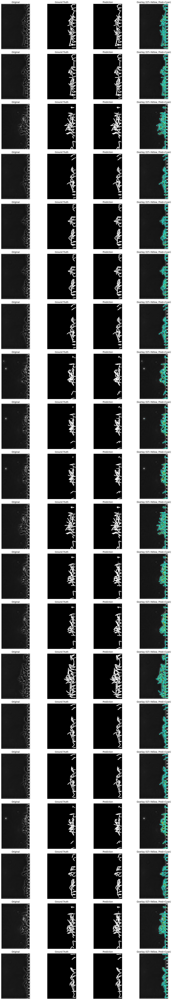

In [ ]:
num_samples = 20
indices = np.random.choice(len(test_dataset), num_samples, replace=False)

plt.figure(figsize=(16, 4*num_samples))

for row, idx in enumerate(indices):
    sample = test_dataset[idx]

    image   = sample["image"]
    gt_mask = (sample["mask"] > 0).astype(np.uint8)

    pred = predict_mask(eval_fine_tuner, image)
    pred_bin = (pred > 0.5).astype(np.uint8)

    # ORIGINAL
    plt.subplot(num_samples, 4, row*4 + 1)
    plt.imshow(image)
    plt.title("Original")
    plt.axis("off")

    # GROUND TRUTH
    plt.subplot(num_samples, 4, row*4 + 2)
    plt.imshow(gt_mask, cmap="gray")
    plt.title("Ground Truth")
    plt.axis("off")

    # PREDICTED MASK
    plt.subplot(num_samples, 4, row*4 + 3)
    plt.imshow(pred_bin, cmap="gray")
    plt.title("Prediction")
    plt.axis("off")

    # OVERLAY
    plt.subplot(num_samples, 4, row*4 + 4)
    plt.imshow(image)
    plt.contour(gt_mask, colors="yellow", linewidths=1)
    plt.contour(pred_bin, colors="cyan", linewidths=1)
    plt.title("Overlay (GT=Yellow, Pred=Cyan)")
    plt.axis("off")

plt.tight_layout()
plt.show()


## Exp 2 - Add Augmentation

In [ ]:
!pip install albumentations

In [ ]:
import albumentations as A

train_transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),

    # slight rotation
    A.Rotate(limit=10, p=0.5),

    # recommended replacement for ShiftScaleRotate
    A.Affine(
        scale=(0.9, 1.1),
        translate_percent=(0.03, 0.03),
        rotate=0,
        p=0.3
    ),

    # slight contrast/brightness change
    A.RandomBrightnessContrast(p=0.3),

], additional_targets={'mask': 'mask'})

train_dataset = BacteriaSegmentationDataset(
    ref_raw, ref_mask,
    rif_raw, rif_mask,
    train_positions,
    transform=train_transform
)

val_dataset = BacteriaSegmentationDataset(
    ref_raw, ref_mask,
    rif_raw, rif_mask,
    val_positions,
    transform=None
)

test_dataset = BacteriaSegmentationDataset(
    ref_raw, ref_mask,
    rif_raw, rif_mask,
    test_positions,
    transform=None
)

Loaded 1694 samples
Loaded 484 samples
Loaded 242 samples


In [ ]:
sam_model, device = load_sam_model()

config = {
    'exp_name': 'bacteria_sam_v1_augmented',
    'batch_size': 4,
    'num_epochs': 10,
    'learning_rate': 1e-4,
    'optimizer': 'adamw',
    'weight_decay': 1e-4,
    'grad_clip': 1.0,
    'lora_rank': 64,
    'bce_weight': 0.5,            # BCE smaller because dice dominates
    'dice_weight': 1.0,
    'pos_weight': 1.5,            # BETTER precision/recall balance
    'scheduler': 'cosine',
    'early_stop_patience': 5,
}

history, fine_tuner, checkpoint_dir = train_sam_lora(
    sam_model=sam_model,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    config=config,
    save_to_drive=True
)

Checkpoints will be saved to: /content/drive/MyDrive/SAM_Bacteria_Finetuning/checkpoints/bacteria_sam_v1_augmented
Using device: cuda
Training batches: 424
Validation batches: 121
Applied LoRA (rank=64) to 12 transformer blocks
Using pos_weight=1.5 (prioritizing detection recall)
Trainable parameters:    6,417,636 (6.68%)
  - LoRA parameters:     2,359,296
  - Decoder parameters:  4,058,340
Using CosineAnnealingLR scheduler


Epoch 1/10 [Train]: 100%|██████████| 424/424 [27:11<00:00,  3.85s/it, loss=0.1298, dice=0.8496, iou=0.7385, lr=1.00e-04]



Epoch 1/10 | LR: 1.00e-04
  Train | Loss: 0.2053 | Dice: 0.8496 | IoU: 0.7385
        | Precision: 0.8246 | Recall: 0.8762 | F1: 0.8496
  Val   | Loss: 0.1307 | Dice: 0.9016 | IoU: 0.8209
        | Precision: 0.9098 | Recall: 0.8936 | F1: 0.9016
  New best model saved (Dice: 0.9016)


Epoch 2/10 [Train]: 100%|██████████| 424/424 [27:10<00:00,  3.85s/it, loss=0.1227, dice=0.8922, iou=0.8054, lr=9.76e-05]



Epoch 2/10 | LR: 9.76e-05
  Train | Loss: 0.1423 | Dice: 0.8922 | IoU: 0.8054
        | Precision: 0.8679 | Recall: 0.9179 | F1: 0.8922
  Val   | Loss: 0.1103 | Dice: 0.9155 | IoU: 0.8442
        | Precision: 0.8864 | Recall: 0.9467 | F1: 0.9155
  New best model saved (Dice: 0.9155)


Epoch 3/10 [Train]: 100%|██████████| 424/424 [27:11<00:00,  3.85s/it, loss=0.1205, dice=0.9011, iou=0.8200, lr=9.05e-05]



Epoch 3/10 | LR: 9.05e-05
  Train | Loss: 0.1297 | Dice: 0.9011 | IoU: 0.8200
        | Precision: 0.8787 | Recall: 0.9247 | F1: 0.9011
  Val   | Loss: 0.1087 | Dice: 0.9174 | IoU: 0.8474
        | Precision: 0.9147 | Recall: 0.9201 | F1: 0.9174
  New best model saved (Dice: 0.9174)


Epoch 4/10 [Train]: 100%|██████████| 424/424 [27:10<00:00,  3.85s/it, loss=0.1230, dice=0.9057, iou=0.8277, lr=7.96e-05]



Epoch 4/10 | LR: 7.96e-05
  Train | Loss: 0.1230 | Dice: 0.9057 | IoU: 0.8277
        | Precision: 0.8843 | Recall: 0.9282 | F1: 0.9057
  Val   | Loss: 0.0988 | Dice: 0.9241 | IoU: 0.8588
        | Precision: 0.9071 | Recall: 0.9417 | F1: 0.9241
  New best model saved (Dice: 0.9241)


Epoch 5/10 [Train]: 100%|██████████| 424/424 [27:12<00:00,  3.85s/it, loss=0.1066, dice=0.9098, iou=0.8345, lr=6.58e-05]



Epoch 5/10 | LR: 6.58e-05
  Train | Loss: 0.1170 | Dice: 0.9098 | IoU: 0.8345
        | Precision: 0.8892 | Recall: 0.9313 | F1: 0.9098
  Val   | Loss: 0.1045 | Dice: 0.9209 | IoU: 0.8534
        | Precision: 0.9268 | Recall: 0.9150 | F1: 0.9209
  No improvement (patience: 1/5)
  Checkpoint saved: epoch_5.pth


Epoch 6/10 [Train]: 100%|██████████| 424/424 [27:12<00:00,  3.85s/it, loss=0.1024, dice=0.9129, iou=0.8398, lr=5.05e-05]



Epoch 6/10 | LR: 5.05e-05
  Train | Loss: 0.1126 | Dice: 0.9129 | IoU: 0.8398
        | Precision: 0.8934 | Recall: 0.9334 | F1: 0.9129
  Val   | Loss: 0.1022 | Dice: 0.9215 | IoU: 0.8544
        | Precision: 0.9276 | Recall: 0.9154 | F1: 0.9215
  No improvement (patience: 2/5)


Epoch 7/10 [Train]: 100%|██████████| 424/424 [27:13<00:00,  3.85s/it, loss=0.1010, dice=0.9155, iou=0.8441, lr=3.52e-05]



Epoch 7/10 | LR: 3.52e-05
  Train | Loss: 0.1093 | Dice: 0.9155 | IoU: 0.8441
        | Precision: 0.8964 | Recall: 0.9354 | F1: 0.9155
  Val   | Loss: 0.0956 | Dice: 0.9273 | IoU: 0.8645
        | Precision: 0.9255 | Recall: 0.9292 | F1: 0.9273
  New best model saved (Dice: 0.9273)


Epoch 8/10 [Train]: 100%|██████████| 424/424 [27:13<00:00,  3.85s/it, loss=0.1011, dice=0.9170, iou=0.8468, lr=2.14e-05]



Epoch 8/10 | LR: 2.14e-05
  Train | Loss: 0.1068 | Dice: 0.9170 | IoU: 0.8468
        | Precision: 0.8982 | Recall: 0.9367 | F1: 0.9170
  Val   | Loss: 0.0932 | Dice: 0.9291 | IoU: 0.8676
        | Precision: 0.9249 | Recall: 0.9334 | F1: 0.9291
  New best model saved (Dice: 0.9291)


Epoch 9/10 [Train]:  97%|█████████▋| 412/424 [26:28<00:46,  3.84s/it, loss=0.1008, dice=0.9187, iou=0.8496, lr=1.05e-05]

In [22]:
# Load best checkpoint
best_checkpoint_path = f"/content/drive/MyDrive/SAM_Bacteria_Finetuning/checkpoints/bacteria_sam_v1_augmented/sam_best.pth"
checkpoint = torch.load(best_checkpoint_path, map_location=device)

print(f"Loaded best model from epoch {checkpoint['epoch']}")
print(f"Best Validation Dice: {checkpoint['best_dice']:.4f}")

# Load fresh SAM model
sam_model, device = load_sam_model()

# Create fine_tuner with same config as training
eval_fine_tuner = SAMFineTuner_LoRA(
    sam_model=sam_model,
    device=device,
    lora_rank=checkpoint['lora_rank'],
    learning_rate=1e-4,
    bce_weight=checkpoint['bce_weight'],
    dice_weight=checkpoint['dice_weight']
)

# Load the trained weights
eval_fine_tuner.sam.load_state_dict(checkpoint['model_state_dict'])
eval_fine_tuner.sam.eval();

Loaded best model from epoch 8
Best Validation Dice: 0.9291
Applied LoRA (rank=64) to 12 transformer blocks
Using pos_weight=2.0 (prioritizing detection recall)
Trainable parameters:    6,417,636 (6.68%)
  - LoRA parameters:     2,359,296
  - Decoder parameters:  4,058,340


In [ ]:
def collate_fn(batch):
    return batch

test_loader = DataLoader(
    test_dataset,
    batch_size=4,
    shuffle=False,
    num_workers=2,
    collate_fn=collate_fn
)

test_metrics = evaluate_on_loader(eval_fine_tuner, test_loader)

print("Dice:      ", round(test_metrics["dice"], 4))
print("IoU:       ", round(test_metrics["iou"], 4))
print("Precision: ", round(test_metrics["precision"], 4))
print("Recall:    ", round(test_metrics["recall"], 4))
print("F1:        ", round(test_metrics["f1"], 4))

Dice:       0.9233
IoU:        0.8576
Precision:  0.9065
Recall:     0.9408
F1:         0.9233


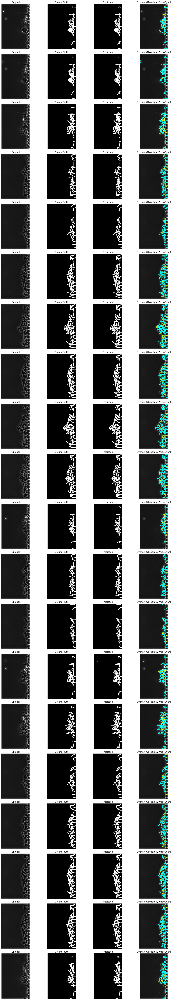

In [23]:
num_samples = 20
indices = np.random.choice(len(test_dataset), num_samples, replace=False)

plt.figure(figsize=(16, 4*num_samples))

for row, idx in enumerate(indices):
    sample = test_dataset[idx]

    image   = sample["image"]
    gt_mask = (sample["mask"] > 0).astype(np.uint8)

    pred = predict_mask(eval_fine_tuner, image)
    pred_bin = (pred > 0.5).astype(np.uint8)

    # ORIGINAL
    plt.subplot(num_samples, 4, row*4 + 1)
    plt.imshow(image)
    plt.title("Original")
    plt.axis("off")

    # GROUND TRUTH
    plt.subplot(num_samples, 4, row*4 + 2)
    plt.imshow(gt_mask, cmap="gray")
    plt.title("Ground Truth")
    plt.axis("off")

    # PREDICTED MASK
    plt.subplot(num_samples, 4, row*4 + 3)
    plt.imshow(pred_bin, cmap="gray")
    plt.title("Prediction")
    plt.axis("off")

    # OVERLAY
    plt.subplot(num_samples, 4, row*4 + 4)
    plt.imshow(image)
    plt.contour(gt_mask, colors="yellow", linewidths=1)
    plt.contour(pred_bin, colors="cyan", linewidths=1)
    plt.title("Overlay (GT=Yellow, Pred=Cyan)")
    plt.axis("off")

plt.tight_layout()
plt.show()


## Exp 3 - Rank 64

In [ ]:
sam_model, device = load_sam_model()

config = {
    'exp_name': 'bacteria_sam_64',
    'batch_size': 4,
    'num_epochs': 10,
    'learning_rate': 1e-4,
    'lora_rank': 64,
    'optimizer': 'adamw',
    'weight_decay': 1e-4,
    'bce_weight': 1.0,
    'dice_weight': 1.0,
    'pos_weight': 1.0,
    'grad_clip': 1.0,
    'scheduler': 'cosine',
    'early_stop_patience': 5
}

history, fine_tuner, checkpoint_dir = train_sam_lora(
    sam_model=sam_model,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    config=config,
    save_to_drive=True
)

Checkpoints will be saved to: /content/drive/MyDrive/SAM_Bacteria_Finetuning/checkpoints/bacteria_sam_64
Using device: cuda
Training batches: 424
Validation batches: 121
Applied LoRA (rank=64) to 12 transformer blocks
Trainable parameters:    6,417,636 (6.68%)
  - LoRA parameters:     2,359,296
  - Decoder parameters:  4,058,340
Using CosineAnnealingLR scheduler


Epoch 1/10 [Train]: 100%|██████████| 424/424 [30:41<00:00,  4.34s/it, loss=0.1264, dice=0.8924, iou=0.8057, lr=1.00e-04]



Epoch 1/10 | LR: 1.00e-04
  Train | Loss: 0.1571 | Dice: 0.8924 | IoU: 0.8057
        | Precision: 0.8767 | Recall: 0.9086 | F1: 0.8924
  Val   | Loss: 0.1190 | Dice: 0.9184 | IoU: 0.8492
        | Precision: 0.8972 | Recall: 0.9407 | F1: 0.9184
  New best model saved (Dice: 0.9184)


Epoch 2/10 [Train]: 100%|██████████| 424/424 [30:39<00:00,  4.34s/it, loss=0.0867, dice=0.9222, iou=0.8556, lr=9.76e-05]



Epoch 2/10 | LR: 9.76e-05
  Train | Loss: 0.1095 | Dice: 0.9222 | IoU: 0.8556
        | Precision: 0.9087 | Recall: 0.9361 | F1: 0.9222
  Val   | Loss: 0.1090 | Dice: 0.9252 | IoU: 0.8608
        | Precision: 0.9094 | Recall: 0.9415 | F1: 0.9252
  New best model saved (Dice: 0.9252)


Epoch 3/10 [Train]: 100%|██████████| 424/424 [30:40<00:00,  4.34s/it, loss=0.0937, dice=0.9290, iou=0.8675, lr=9.05e-05]



Epoch 3/10 | LR: 9.05e-05
  Train | Loss: 0.0991 | Dice: 0.9290 | IoU: 0.8675
        | Precision: 0.9168 | Recall: 0.9416 | F1: 0.9290
  Val   | Loss: 0.1046 | Dice: 0.9283 | IoU: 0.8663
        | Precision: 0.9092 | Recall: 0.9483 | F1: 0.9283
  New best model saved (Dice: 0.9283)


Epoch 4/10 [Train]: 100%|██████████| 424/424 [30:42<00:00,  4.34s/it, loss=0.0885, dice=0.9328, iou=0.8741, lr=7.96e-05]



Epoch 4/10 | LR: 7.96e-05
  Train | Loss: 0.0935 | Dice: 0.9328 | IoU: 0.8741
        | Precision: 0.9217 | Recall: 0.9443 | F1: 0.9328
  Val   | Loss: 0.1069 | Dice: 0.9263 | IoU: 0.8628
        | Precision: 0.9284 | Recall: 0.9242 | F1: 0.9263
  No improvement (patience: 1/5)


Epoch 5/10 [Train]: 100%|██████████| 424/424 [30:41<00:00,  4.34s/it, loss=0.0806, dice=0.9357, iou=0.8791, lr=6.58e-05]



Epoch 5/10 | LR: 6.58e-05
  Train | Loss: 0.0893 | Dice: 0.9357 | IoU: 0.8791
        | Precision: 0.9250 | Recall: 0.9465 | F1: 0.9357
  Val   | Loss: 0.1029 | Dice: 0.9297 | IoU: 0.8687
        | Precision: 0.9195 | Recall: 0.9402 | F1: 0.9297
  New best model saved (Dice: 0.9297)
  Checkpoint saved: epoch_5.pth


Epoch 6/10 [Train]: 100%|██████████| 424/424 [30:43<00:00,  4.35s/it, loss=0.0959, dice=0.9377, iou=0.8827, lr=5.05e-05]



Epoch 6/10 | LR: 5.05e-05
  Train | Loss: 0.0864 | Dice: 0.9377 | IoU: 0.8827
        | Precision: 0.9275 | Recall: 0.9481 | F1: 0.9377
  Val   | Loss: 0.0984 | Dice: 0.9323 | IoU: 0.8731
        | Precision: 0.9257 | Recall: 0.9389 | F1: 0.9323
  New best model saved (Dice: 0.9323)


Epoch 7/10 [Train]: 100%|██████████| 424/424 [30:43<00:00,  4.35s/it, loss=0.0787, dice=0.9394, iou=0.8857, lr=3.52e-05]



Epoch 7/10 | LR: 3.52e-05
  Train | Loss: 0.0839 | Dice: 0.9394 | IoU: 0.8857
        | Precision: 0.9294 | Recall: 0.9496 | F1: 0.9394
  Val   | Loss: 0.0996 | Dice: 0.9316 | IoU: 0.8720
        | Precision: 0.9338 | Recall: 0.9294 | F1: 0.9316
  No improvement (patience: 1/5)


Epoch 8/10 [Train]: 100%|██████████| 424/424 [30:46<00:00,  4.36s/it, loss=0.0859, dice=0.9407, iou=0.8881, lr=2.14e-05]



Epoch 8/10 | LR: 2.14e-05
  Train | Loss: 0.0819 | Dice: 0.9407 | IoU: 0.8881
        | Precision: 0.9311 | Recall: 0.9506 | F1: 0.9407
  Val   | Loss: 0.1002 | Dice: 0.9316 | IoU: 0.8719
        | Precision: 0.9267 | Recall: 0.9364 | F1: 0.9316
  No improvement (patience: 2/5)


Epoch 9/10 [Train]: 100%|██████████| 424/424 [30:45<00:00,  4.35s/it, loss=0.0853, dice=0.9416, iou=0.8897, lr=1.05e-05]



Epoch 9/10 | LR: 1.05e-05
  Train | Loss: 0.0805 | Dice: 0.9416 | IoU: 0.8897
        | Precision: 0.9321 | Recall: 0.9514 | F1: 0.9416
  Val   | Loss: 0.0974 | Dice: 0.9335 | IoU: 0.8753
        | Precision: 0.9283 | Recall: 0.9387 | F1: 0.9335
  New best model saved (Dice: 0.9335)


Epoch 10/10 [Train]:  90%|█████████ | 383/424 [27:48<02:59,  4.37s/it, loss=0.0795, dice=0.9418, iou=0.8900, lr=3.42e-06]

In [24]:
# Load best checkpoint
best_checkpoint_path = f"/content/drive/MyDrive/SAM_Bacteria_Finetuning/checkpoints/bacteria_sam_64/sam_best.pth"
checkpoint = torch.load(best_checkpoint_path, map_location=device)

print(f"Loaded best model from epoch {checkpoint['epoch']}")
print(f"Best Validation Dice: {checkpoint['best_dice']:.4f}")

# Load fresh SAM model
sam_model, device = load_sam_model()

# Create fine_tuner with same config as training
eval_fine_tuner = SAMFineTuner_LoRA(
    sam_model=sam_model,
    device=device,
    lora_rank=checkpoint['lora_rank'],
    learning_rate=1e-4,
    bce_weight=checkpoint['bce_weight'],
    dice_weight=checkpoint['dice_weight']
)

# Load the trained weights
eval_fine_tuner.sam.load_state_dict(checkpoint['model_state_dict'])
eval_fine_tuner.sam.eval();

Loaded best model from epoch 9
Best Validation Dice: 0.9335
Applied LoRA (rank=64) to 12 transformer blocks
Using pos_weight=2.0 (prioritizing detection recall)
Trainable parameters:    6,417,636 (6.68%)
  - LoRA parameters:     2,359,296
  - Decoder parameters:  4,058,340


In [11]:
def collate_fn(batch):
    return batch

test_loader = DataLoader(
    test_dataset,
    batch_size=4,
    shuffle=False,
    num_workers=2,
    collate_fn=collate_fn
)

test_metrics = evaluate_on_loader(eval_fine_tuner, test_loader)

print("Dice:      ", round(test_metrics["dice"], 4))
print("IoU:       ", round(test_metrics["iou"], 4))
print("Precision: ", round(test_metrics["precision"], 4))
print("Recall:    ", round(test_metrics["recall"], 4))
print("F1:        ", round(test_metrics["f1"], 4))

Dice:       0.9252
IoU:        0.8609
Precision:  0.9148
Recall:     0.9359
F1:         0.9252


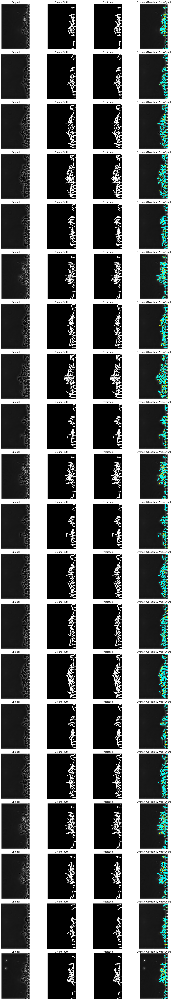

In [25]:
num_samples = 20
indices = np.random.choice(len(test_dataset), num_samples, replace=False)

plt.figure(figsize=(16, 4*num_samples))

for row, idx in enumerate(indices):
    sample = test_dataset[idx]

    image   = sample["image"]
    gt_mask = (sample["mask"] > 0).astype(np.uint8)

    pred = predict_mask(eval_fine_tuner, image)
    pred_bin = (pred > 0.5).astype(np.uint8)

    # ORIGINAL
    plt.subplot(num_samples, 4, row*4 + 1)
    plt.imshow(image)
    plt.title("Original")
    plt.axis("off")

    # GROUND TRUTH
    plt.subplot(num_samples, 4, row*4 + 2)
    plt.imshow(gt_mask, cmap="gray")
    plt.title("Ground Truth")
    plt.axis("off")

    # PREDICTED MASK
    plt.subplot(num_samples, 4, row*4 + 3)
    plt.imshow(pred_bin, cmap="gray")
    plt.title("Prediction")
    plt.axis("off")

    # OVERLAY
    plt.subplot(num_samples, 4, row*4 + 4)
    plt.imshow(image)
    plt.contour(gt_mask, colors="yellow", linewidths=1)
    plt.contour(pred_bin, colors="cyan", linewidths=1)
    plt.title("Overlay (GT=Yellow, Pred=Cyan)")
    plt.axis("off")

plt.tight_layout()
plt.show()
